In [1]:
source("C:/Users/Tom Work/PycharmProjects/twipsy-lite/ts.R")


Attaching package: 'zoo'

The following objects are masked from 'package:base':

    as.Date, as.Date.numeric

Loading required package: timeDate
This is forecast 7.1 



In [2]:
library(Rwave)

In [29]:
s = sept_ts()

 [1] 408 409 410 411 412 413 414 415 476 477 478 479 485 486 721 722 723 724 725
 [1] 408 409 410 411 412 413 414 415 476 477 478 479 485 486 721 722 723 724 725


In [4]:
shift = 32
june_cas = ts(preprocessing('E:/summary/june_casual.csv', 'E:/summary/june_total.csv')$series[(shift+1):(672+shift)], frequency=24)
june_tot = ts(preprocessing('E:/summary/june_casual.csv', 'E:/summary/june_total.csv')$total[(shift+1):(672+shift)], frequency=24)
j = june_cas/june_tot

 [1]   2   3   4   5   6   7  26  27  28  29  30  31 721 722 723
 [1]   2   3   4   5   6   7  26  27  28  29  30  31 721 722 723


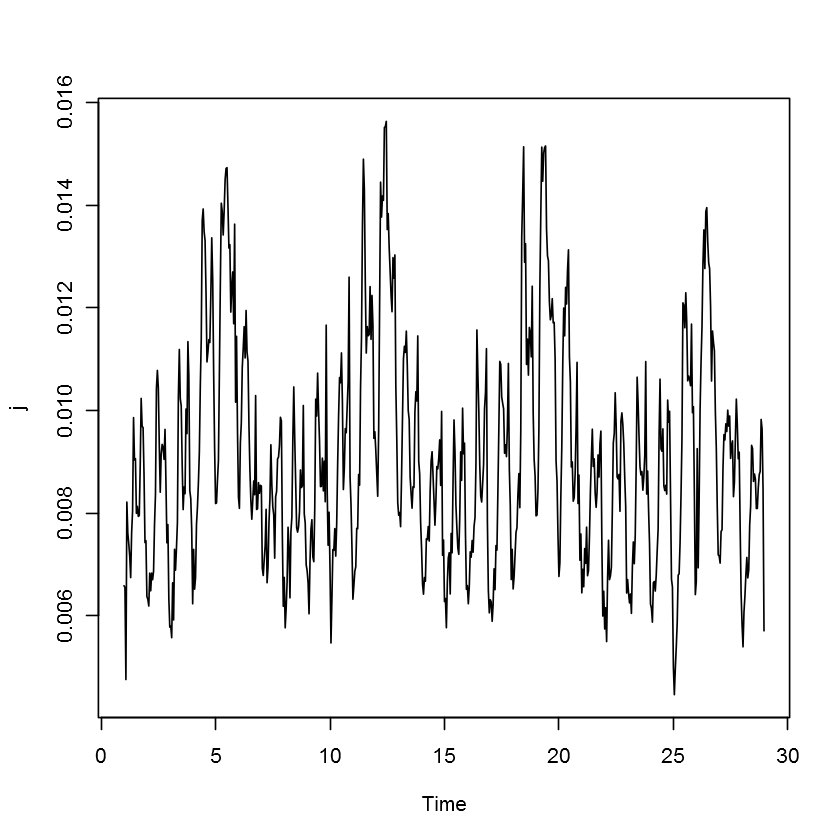

In [5]:
plot.ts(j)

In [5]:
m = cwt(j, noctave=7, w0=(2*pi), nvoice=20, plot=FALSE)

In [6]:
peaks <- function(ts){
    for (i in 1:length(ts-2)){
        if (ts[i+1] > ts[i+2] && ts[i+1]>ts[i]){
            print(i)
        }
    }
}

In [60]:
require(graphics)

In [ ]:
expression(('M'['k'])^2)

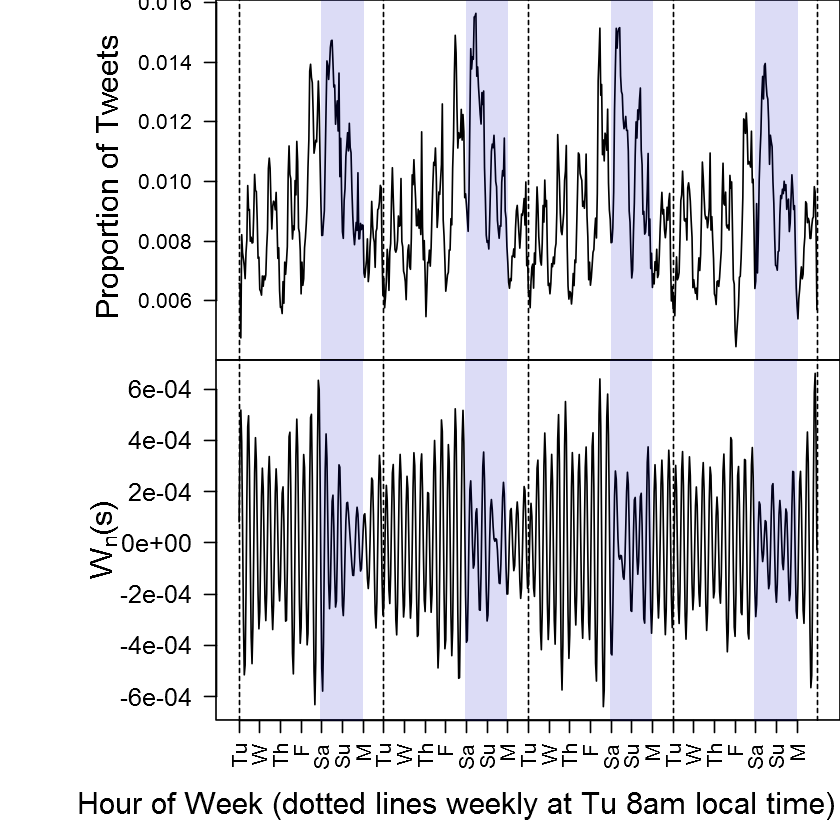

png 
  2

png 
  2

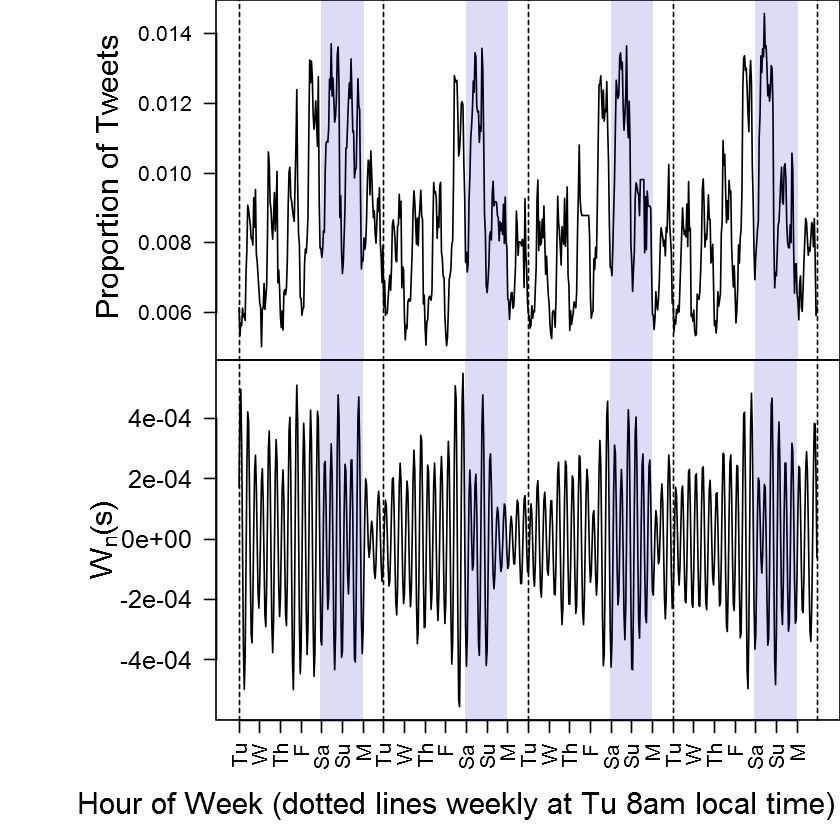

In [107]:
plot_3daily <- function(ts){
    m = cwt(ts, noctave=7, w0=(2*pi), nvoice=20, plot=FALSE)
    component=43
    
    shade_color <- rgb(0, 0, 190, alpha=35, maxColorValue=255)

    # outer margin
    par(oma = c(5, 3, 0, 0))
    
    par(mfrow=c(2,1))
    par(mar = c(0, 6, 0, 0))
    
    # time series plot
    plot(ts, xaxt='n', las=1, cex.axis=1.2, ylab='')
    title(ylab='Proportion of Tweets', cex.lab=1.5, line=4)
    #highlight
    yrange=par("yaxp")[1:2]
    for (week in 0:3){
    rect(xleft=(5+7*week), xright=(7+7*week), ybottom=(yrange[1]-0.005), ytop=(yrange[2]+0.005),col=shade_color, border=NA)
        }
    abline(v=seq(1, 29, by=7), lty=2)

    # wavelet transform
    plot(Re(m[,component]), type='l', xaxt='n', ylab='', las=1, cex.axis=1.2)
    yrange=par("yaxp")[1:2]
    title(cex.lab =1.5, ylab=expression(paste('W'['n'], '(s)')), line=4)
    abline(v=seq(1, (29*24), by=(24*7)), lty=2)
    axis(1, labels = rep(c('Tu', 'W', 'Th', 'F', 'Sa', 'Su', 'M'),4), at=seq(1, (24*28), by=24), outer=TRUE, las=2, cex=2)
    #highlight
    yrange=par("yaxp")[1:2]
    for (week in 0:3){
    rect(xleft=(24*4+168*week), xright=(24*6+168*week), ybottom=(yrange[1]-0.005), ytop=(yrange[2]+0.005),col=shade_color, border=NA)
        }
    mtext('Hour of Week (dotted lines weekly at Tu 8am local time)', cex=1.5, side = 1, outer = TRUE, line = 3)
}
plot_mj <- function(){plot_3daily(j)}
plot_ms <- function(){plot_3daily(s)}
plot_mj()
plot_ms()
png(filename='c:/users/tom work/pycharmprojects/twipsy-lite/plots/3daily_morlet_j.png', height=800)
plot_mj()
dev.off()
png(filename='c:/users/tom work/pycharmprojects/twipsy-lite/plots/3daily_morlet_s.png', height=600)
plot_ms()
dev.off()

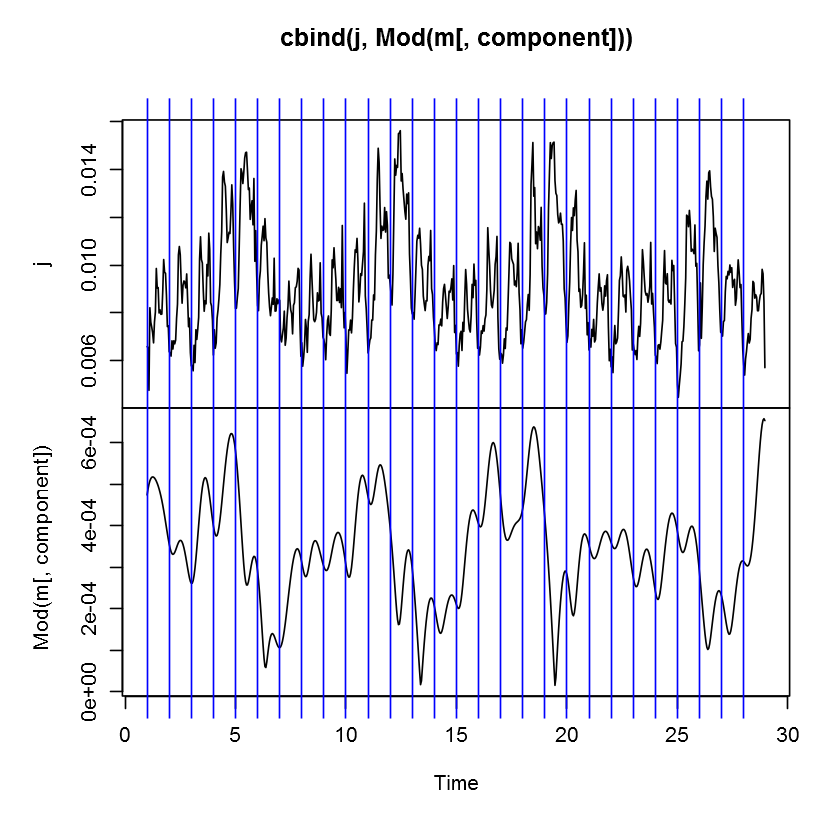

In [15]:
m = cwt(j, noctave=7, w0=(2*pi), nvoice=20, plot=FALSE)
component=42
plot.ts(cbind(j, Mod(m[,component])))
abline(v=seq(1,(28), 1), col='blue')

In [324]:
save_png(plot_morlet_phase, 'c:/users/tom work/pycharmprojects/twipsy-lite/plots/morlet-phase.png')

png 
  2

In [323]:
plot_morlet_phase <- function(){
m = cwt(j, noctave=7, w0=(2*pi), nvoice=20, plot=FALSE)
component=73
phase = Arg(m[,component])
plot.ts(cbind(j, Re(m[,component]), phase), main='Morlet Transform and Phase')
abline(v=1:28, col='blue')
# abline(v=0.5 + 1:28, col='purple')
    }

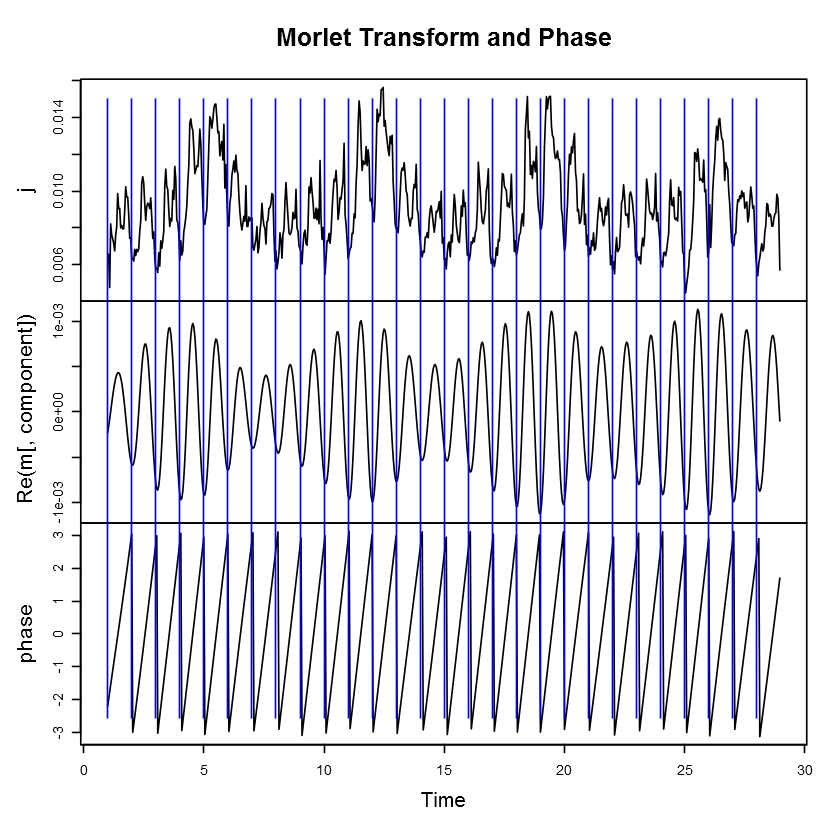

In [301]:
m = cwt(j, noctave=7, w0=(2*pi), nvoice=20, plot=FALSE)
component=73
phase = Arg(m[,component])
plot.ts(cbind(j, Re(m[,component]), phase), main='Morlet Transform and Phase')
abline(v=1:28, col='blue')
# abline(v=0.5 + 1:28, col='purple')

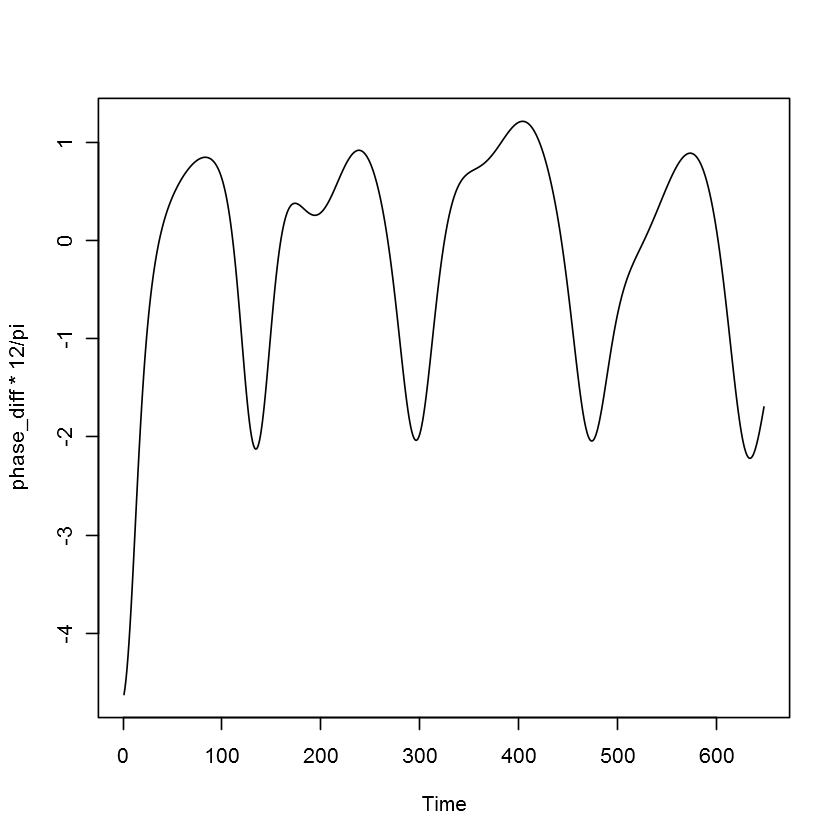

In [284]:
component=72
phase_diff =Arg(m[25:672,component]/m[1:(672-24), component])
plot.ts(phase_diff*12/pi)

In [268]:
seq(1, (672-24), 24)

[1]   1  25  49  73  97 121 145 169 193 217 241 265 289 313 337 361 385 409 433
[20] 457 481 505 529 553 577 601 625

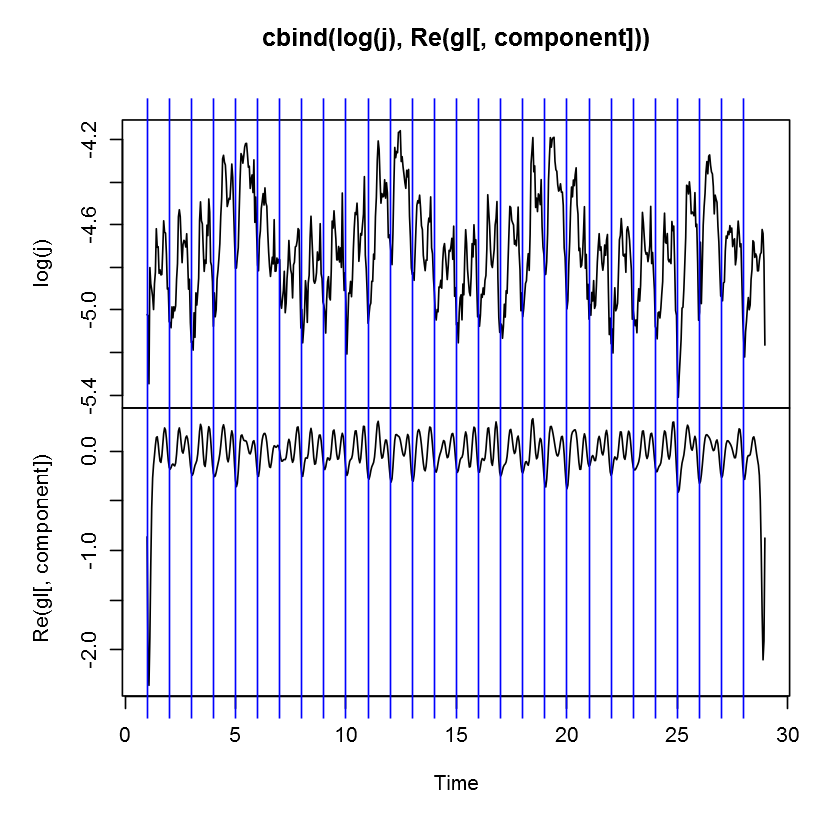

In [353]:
gl = DOG(log(j), noctave=10, moments=2, nvoice=10, plot=FALSE)
component=25
plot.ts(cbind(log(j),Re(gl[, component])))
abline(v=1:28, col='blue')
# plot.ts(Re(g[seq(5, 24*28, 8),component]))
# abline(v=seq(1, 3*28, 3), col='blue')

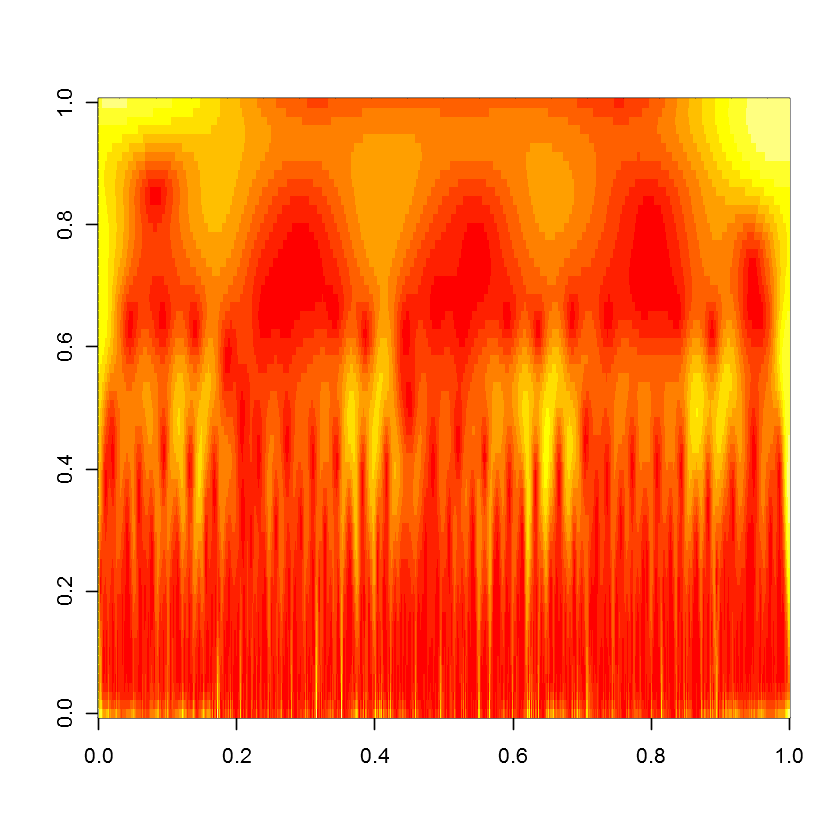

In [357]:
g = DOG(j, noctave=7, moments=2, nvoice=10)